# FCIM.M.IA - Artificial Intelligence

> **Lab 2:** Flocking Behaviour \\
> **Performed by:** Astafi Valentina, group TI-231M \\
> **Verified by:** Mihail Gavrilita, asist. univ.

## Imports and Utils

In [1]:
import math
import random
import numpy as np
import SimpleGUICS2Pygame.simpleguics2pygame as simplegui
from IPython.display import Image

## Task 1 -- Implement the Vector class 

In [ ]:
class VectorList:

    def vector_norm(self, vector):
        return sum([x ** 2 for x in vector]) ** 0.5

    def vector_add(self, vector1, vector2):
        return [vector1[i] + vector2[i] for i in range(len(vector1))]

    def vector_subtract(self, vector1, vector2):
        return [vector1[i] - vector2[i] for i in range(len(vector1))]

    def vector_multiply(self, vector, scalar):
        return [vector[i] * scalar for i in range(len(vector))]

    def vector_division(self, vector, scalar):
        if scalar != 0:
            return [vector[i] / scalar for i in range(len(vector))]

    def dot_product(self, vector1, vector2):
        return sum([vector1[i] * vector2[i] for i in range(len(vector1))])

    def cross_product(self, vector1, vector2):
        return [vector1[1] * vector2[2] - vector1[2] * vector2[1],
                vector1[2] * vector2[0] - vector1[0] * vector2[2],
                vector1[0] * vector2[1] - vector1[1] * vector2[0]]

In [ ]:
class VectorNumpy:
    def vector_norm(self, vector):
        return np.linalg.norm(vector)

    def vector_add(self, vector1, vector2):
        return np.add(vector1, vector2)

    def vector_subtract(self, vector1, vector2):
        return np.subtract(vector1, vector2)

    def vector_multiply(self, vector, scalar):
        return np.multiply(vector, scalar)

    def vector_division(self, vector, scalar):
        return np.divide(vector, scalar)

    def dot_product(self, vector1, vector2):
        return np.dot(vector1, vector2)

    def cross_product(self, vector1, vector2):
        return np.cross(vector1, vector2)

The VectorNumpy class was implemented using the Number Library in Python, for the same vectors.

## Task 2 -- Using the Vector class and the provided paper, implement the Boid class with the steering behaviors

In [ ]:
class Boid:
    def __init__(self, sprite):
        self.sprite = sprite

    def alignment(self, neighbors, strength=0.05):
        if not neighbors:
            return [0, 0]
        avg_vel = average_vectors([boid.vel for boid in neighbors])
        return multiply_vector(avg_vel, strength)

    def cohesion(self, neighbors, strength=0.01):
        if not neighbors:
            return [0, 0]
        avg_pos = average_vectors([boid.pos for boid in neighbors])
        to_avg_pos = subtract_vector(avg_pos, self.sprite.pos)
        return multiply_vector(to_avg_pos, strength)

    def separation(self, neighbors, strength=0.05, desired_separation=50):
        if not neighbors:
            return [0, 0]
        separation_force = [0, 0]
        for boid in neighbors:
            distance = dist(self.sprite.pos, boid.pos)
            if distance < desired_separation:
                to_boid = subtract_vector(self.sprite.pos, boid.pos)
                separation_force = add_vector(separation_force, to_boid)
        return multiply_vector(separation_force, strength)

## Task 3 -- Add the calm flocking behaviour to the Boid class according to the provided paper, using the 3 steering behaviours implemented in the Task 2.

In [ ]:
    def apply_calm_behavior(self, neighbors):
        align = self.alignment(neighbors)
        cohes = self.cohesion(neighbors)
        separ = self.separation(neighbors)
        self.sprite.vel = add_vector(self.sprite.vel, align)
        self.sprite.vel = add_vector(self.sprite.vel, cohes)
        self.sprite.vel = add_vector(self.sprite.vel, separ)
        self.sprite.vel = limit_vector(self.sprite.vel, 3)  # Ensure controlled movement

    def apply_attack_behavior(self, target):
        attk = self.attack(target)
        self.sprite.vel = add_vector(self.sprite.vel, attk)
        self.sprite.vel = limit_vector(self.sprite.vel, 5)  # Ensure aggressive movement

    def apply_evade_behavior(self, target):
        evd = self.evade(target)
        self.sprite.vel = add_vector(self.sprite.vel, evd)
        self.sprite.vel = limit_vector(self.sprite.vel, 5)  # Ensure defensive movement


## Task 4 -- Combine the Boid class with the behaviours implemented in previous tasks with the provided code for the simulation of S. tuberosum and run it in CodeSkulptor. The rocks should exhibit flocking behaviour as implemented in the Boid class.

In [ ]:
self.behavior.apply_calm_behavior(close_boids)

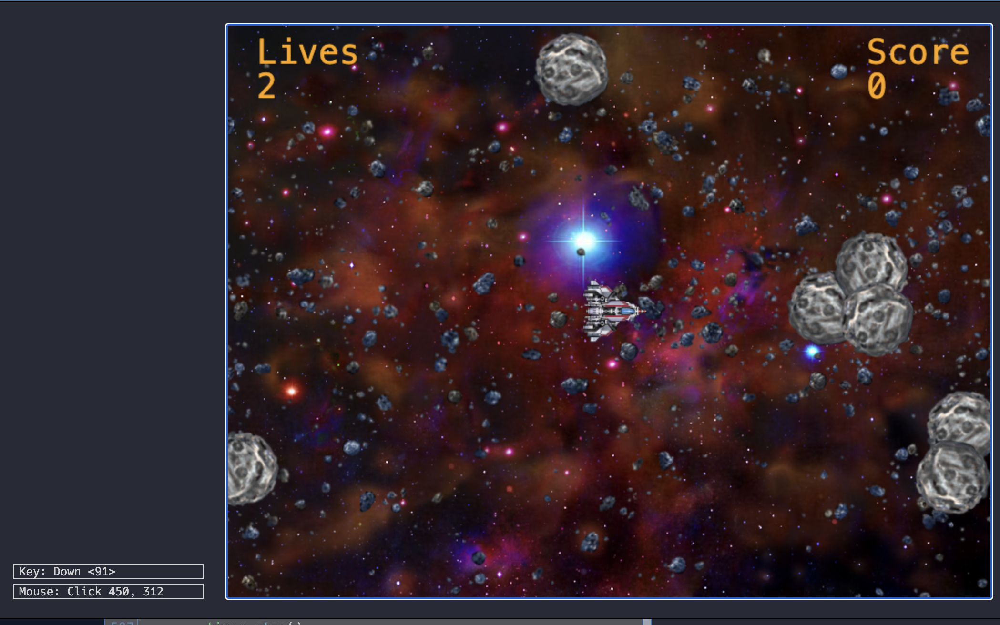

In [4]:
Image(filename="./results/1.png")

In [ ]:
self.behavior.apply_attack_behavior(my_ship)

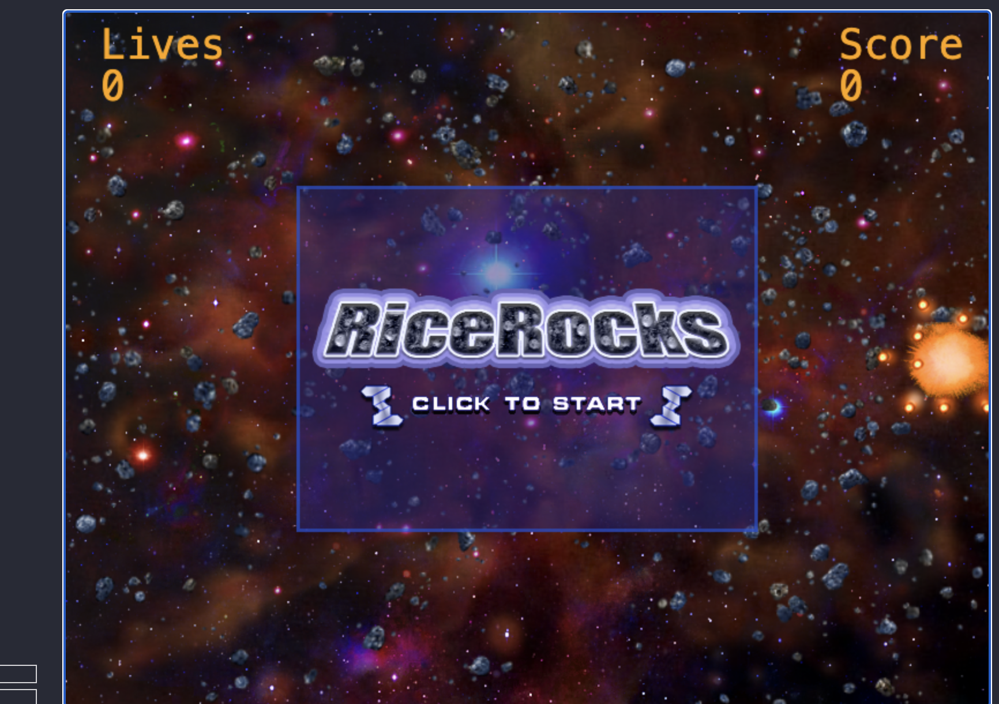

In [3]:
Image(filename="./results/2.png")

In [ ]:
self.behavior.apply_evade_behavior(my_ship)

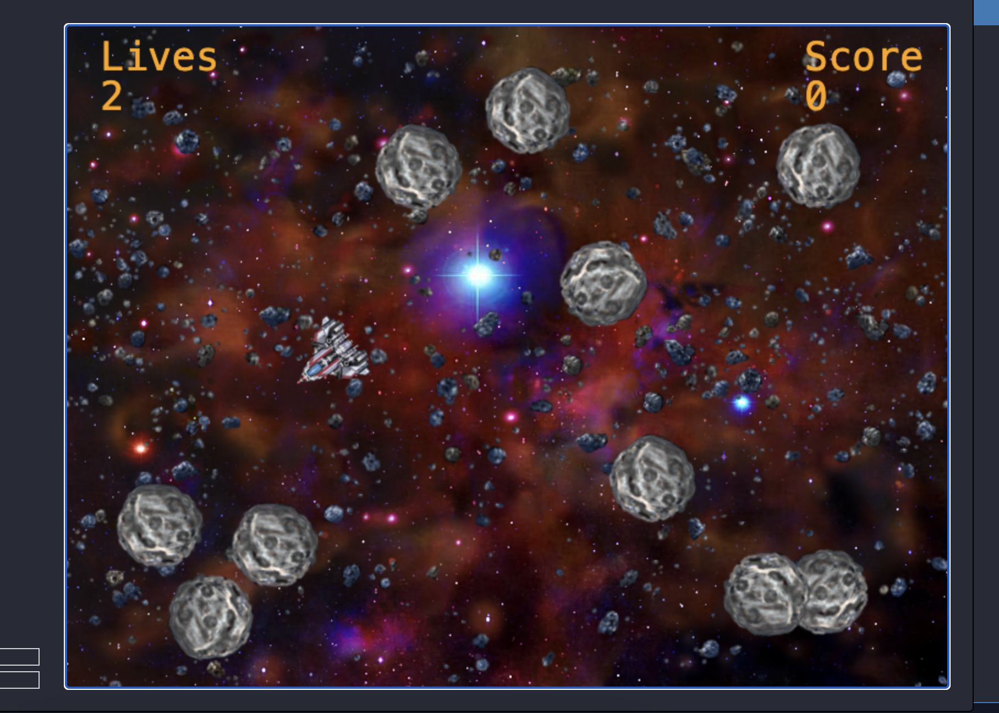

In [2]:
Image(filename="./results/3.png")

## Conclusions:

In the laboratory work Flocking behavior we studied the practical concepts related to grouping behaviors (flocking) and we simulated different autonomous behaviors and dynamic interactions.
By implementing the Vector and Boid classes, we explored how objects can interact based on simple rules to produce complex behaviors such as separation, alignment, and cohesion. Using Python and the NumPy library to manipulate the vectors made the numerical calculations easy, although I had to adapt and implement solutions compatible with the CodeSkulptor environment for the interactive simulations.

## Bibliography:

[1] Vectors in Python. Available: https://www.digitalocean.com/community/tutorials/vectors-in-python
[2] Boids. Available: https://www.red3d.com/cwr/boids/
[3] CodeSkulptor3. Available: https://py3.codeskulptor.org/
[4] CodeSkulptor3 Documentation. Available: https://py3.codeskulptor.org/docs.html#tabs-Python